# **IMPORTING LIBRARIES AND TOOLS**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as stats
import statsmodels.api as sm
from plotly.subplots import make_subplots
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline as make_pipeline_imblearn
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import make_scorer
from sklearn.metrics import confusion_matrix
from sklearn.impute import SimpleImputer
from sklearn.utils import resample
from sklearn.metrics import classification_report
from imblearn.pipeline import Pipeline
from sklearn.utils import class_weight
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.impute import KNNImputer
from imblearn.combine import SMOTEENN
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier
from sklearn.metrics import precision_recall_curve
import xgboost as xgb
from collections import Counter

## **Loading dataset**

In [2]:
# Load the dataset
heart_data = pd.read_csv('heart_2020_cleaned.csv')

### **Data Cleaning and Preprocessing**

In [3]:
# Check for missing value
heart_data.isnull().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64

In [4]:
heart_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [5]:
heart_data.shape

(319795, 18)

In [6]:
heart_data.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


## EXPLORATORY DATA ANALYSIS

In [7]:
# Setting up the aesthetics for plots
sns.set(style="whitegrid")

In [8]:
# Summary statistics for numerical columns
numerical_summary = heart_data.describe()
numerical_summary

,BMI,PhysicalHealth,MentalHealth,SleepTime
count,319795.000000,319795.00000,319795.000000,319795.000000
mean,28.325399,3.37171,3.898366,7.097075
std,6.356100,7.95085,7.955235,1.436007
min,12.020000,0.00000,0.000000,1.000000
25%,24.030000,0.00000,0.000000,6.000000
50%,27.340000,0.00000,0.000000,7.000000
75%,31.420000,2.00000,3.000000,8.000000
max,94.850000,30.00000,30.000000,24.000000


In [9]:
# Preparing data for the plot
counts = heart_data['HeartDisease'].value_counts()
percentages = heart_data['HeartDisease'].value_counts(normalize=True) * 100
data_for_plot = counts.reset_index()
data_for_plot.columns = ['HeartDisease', 'Counts']
data_for_plot['Percentage'] = percentages.values

# Mapping colors
color_map = {'Yes': 'red', 'No': 'green'}
data_for_plot['Color'] = data_for_plot['HeartDisease'].map(color_map)

# Creating the interactive plot
fig = px.bar(data_for_plot, x='HeartDisease', y='Counts',
             text=[f'{cnt} ({pct:.2f}%)' for cnt, pct in zip(data_for_plot['Counts'], data_for_plot['Percentage'])],
             color='Color',
             color_discrete_map='identity')

# Updating layout
fig.update_layout(title_text='Distribution of Heart Disease Cases',
                  xaxis_title='Heart Disease',
                  yaxis_title='Counts',
                  showlegend=False)

fig.show()

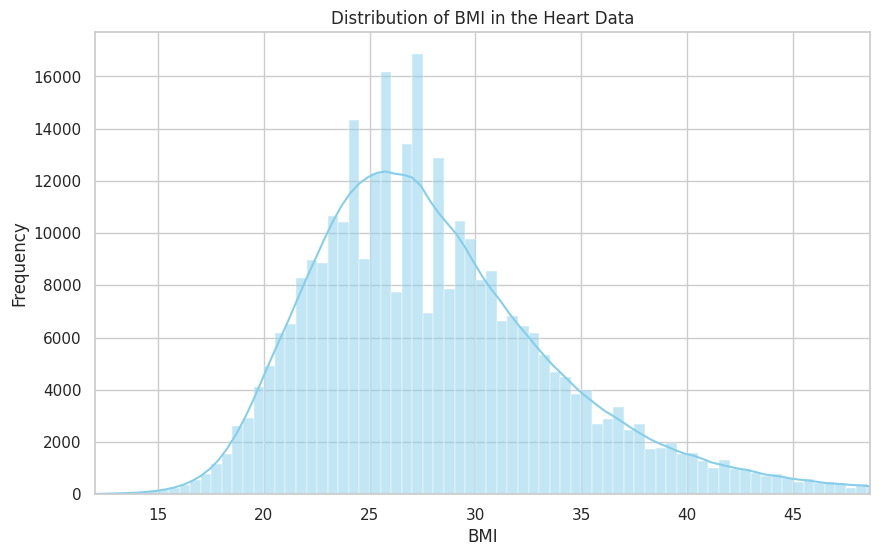

In [10]:
plt.figure(figsize=(10, 6))
sns.histplot(heart_data['BMI'], bins=np.arange(heart_data['BMI'].min(), heart_data['BMI'].max() + 0.5, 0.5), kde=True, color='skyblue')
plt.title('Distribution of BMI in the Heart Data')
plt.xlabel('BMI')
plt.ylabel('Frequency')
plt.xlim([heart_data['BMI'].min(), heart_data['BMI'].quantile(0.99)])  # Limiting range to 99th percentile to handle outliers
plt.show()

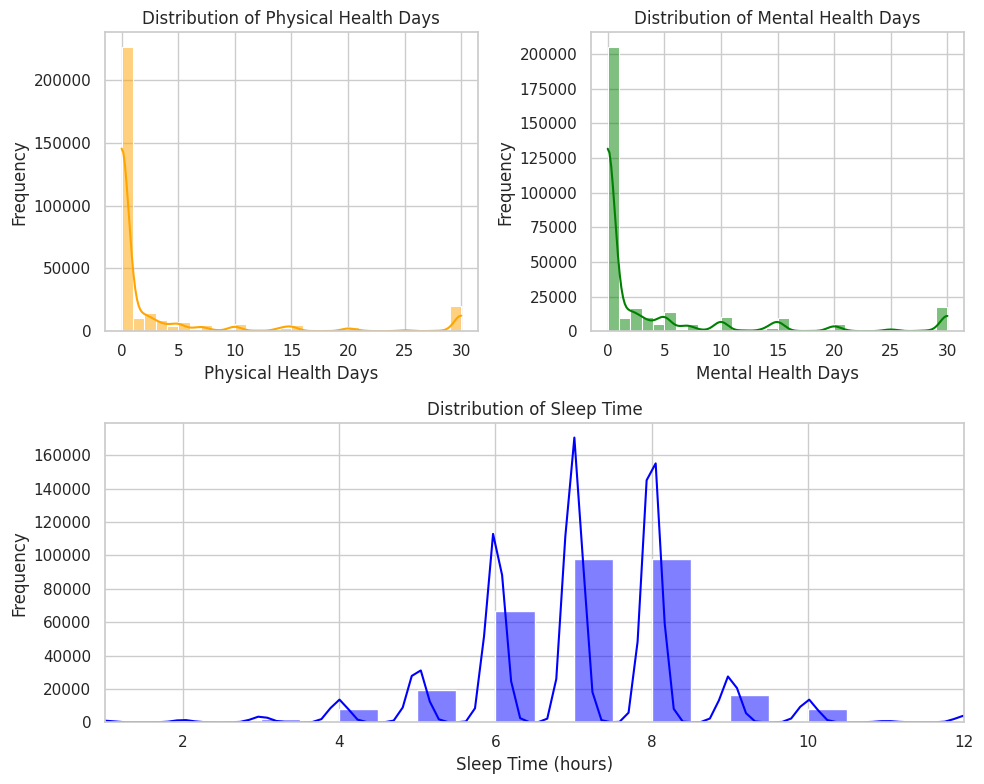

In [11]:
# Setting up the aesthetics for plots
plt.figure(figsize=(10, 8))

# Histogram for PhysicalHealth
plt.subplot(2, 2, 1)
sns.histplot(heart_data['PhysicalHealth'], bins=30, kde=True, color='orange')
plt.title('Distribution of Physical Health Days')
plt.xlabel('Physical Health Days')
plt.ylabel('Frequency')

# Histogram for MentalHealth
plt.subplot(2, 2, 2)
sns.histplot(heart_data['MentalHealth'], bins=30, kde=True, color='green')
plt.title('Distribution of Mental Health Days')
plt.xlabel('Mental Health Days')
plt.ylabel('Frequency')

# Histogram for SleepTime
plt.subplot(2, 1, 2)
bin_width_sleep = 0.5  # Define a bin width for SleepTime
sns.histplot(heart_data['SleepTime'], bins=np.arange(heart_data['SleepTime'].min(), heart_data['SleepTime'].max() + bin_width_sleep, bin_width_sleep), kde=True, color='blue')
plt.title('Distribution of Sleep Time')
plt.xlabel('Sleep Time (hours)')
plt.ylabel('Frequency')
plt.xlim([heart_data['SleepTime'].min(), heart_data['SleepTime'].quantile(0.99)])  # Limiting range to 99th percentile to handle outliers

plt.tight_layout()
plt.show()


In [12]:
# Selecting categorical columns for EDA
categorical_columns = ['Smoking', 'DiffWalking', 'Sex',
                       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'Asthma']

# Create a subplot grid
fig = make_subplots(rows=5, cols=3, subplot_titles=[f'Distribution of {col}' for col in categorical_columns])

# Loop through the categorical columns and add bar plots to the subplot grid
for i, column in enumerate(categorical_columns, 1):
    row = (i - 1) // 3 + 1
    col = (i - 1) % 3 + 1

    # Count the occurrences of each category
    category_counts = heart_data[column].value_counts()

    # Create a bar chart for the current column
    fig.add_trace(go.Bar(x=category_counts.index, y=category_counts.values, name=column), row=row, col=col)

# Update layout
fig.update_layout(height=2000, width=1200, showlegend=False, title_text="Categorical Distributions in Heart Data")
fig.update_xaxes(title_text="Category")
fig.update_yaxes(title_text="Count")

fig.show()

### Analyzing the differences between individuals with and without heart disease across other variables

In [13]:
# Selecting relevant columns for comparison
comparison_columns = ['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']

# Creating box plots for each variable, comparing those with and without heart disease
fig = make_subplots(rows=2, cols=2, subplot_titles=[f'Heart Disease Comparison - {col}' for col in comparison_columns])

# Loop through the columns and add box plots to the subplot grid
for i, column in enumerate(comparison_columns, 1):
    row = (i - 1) // 2 + 1
    col = (i - 1) % 2 + 1

    # Create a box plot for the current column
    fig.add_trace(go.Box(x=heart_data['HeartDisease'], y=heart_data[column], name=column), row=row, col=col)

# Update layout
fig.update_layout(height=800, width=800, showlegend=False, title_text="Comparison Across Variables by Heart Disease Status")
fig.update_xaxes(title_text="Heart Disease")
fig.update_yaxes(title_text="Value")

fig.show()


### Categorical columns

In [14]:
# Define the categories for which we want to calculate the proportions
categories = ['DiffWalking', 'Smoking', 'Stroke', 'Diabetic', 'GenHealth',
              'Asthma', 'PhysicalActivity', 'KidneyDisease', 'SkinCancer', 'Sex']

# Initialize a dictionary to store the proportion of heart disease for each category value
proportions = {}

# Loop through each category and calculate the proportions
for category in categories:
    # Get the total count for each category value
    total_counts = heart_data[category].value_counts()
    # Get the count of heart disease cases for each category value
    heart_disease_counts = heart_data[heart_data['HeartDisease'] == 'Yes'][category].value_counts()
    # Calculate the proportions
    category_proportions = heart_disease_counts / total_counts * 100  # Convert to percentage
    # Store the proportions in the dictionary
    proportions[category] = category_proportions

# Convert the dictionary to a DataFrame for easier viewing
proportions_df = pd.DataFrame(proportions)

proportions_df

,DiffWalking,Smoking,Stroke,Diabetic,GenHealth,Asthma,PhysicalActivity,KidneyDisease,SkinCancer,Sex
Excellent,NaN,NaN,NaN,NaN,2.244098,NaN,NaN,NaN,NaN,NaN
Fair,NaN,NaN,NaN,NaN,20.428526,NaN,NaN,NaN,NaN,NaN
Female,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.694675
Good,NaN,NaN,NaN,NaN,10.263183,NaN,NaN,NaN,NaN,NaN
Male,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.618462
No,6.298455,6.033414,7.468982,6.496868,NaN,8.103336,13.758735,7.765181,7.722363,NaN
"No, borderline diabetes",NaN,NaN,NaN,11.635452,NaN,NaN,NaN,NaN,NaN,NaN
Poor,NaN,NaN,NaN,NaN,34.103995,NaN,NaN,NaN,NaN,NaN
Very good,NaN,NaN,NaN,NaN,4.726062,NaN,NaN,NaN,NaN,NaN
Yes,22.580500,12.157716,36.365896,21.952355,NaN,11.506344,7.053239,29.331862,16.700761,NaN


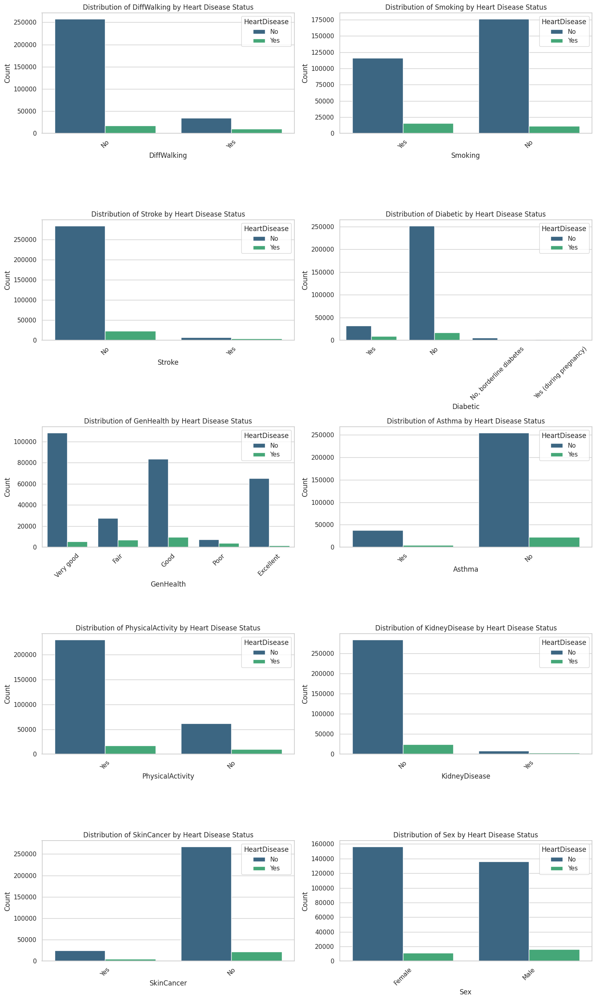

In [15]:
# Selected categorical columns for analysis
selected_categorical = ['DiffWalking', 'Smoking', 'Stroke', 'Diabetic','GenHealth','Asthma','PhysicalActivity', 'KidneyDisease', 'SkinCancer', 'Sex']

# Setting up the figure for multiple subplots
num_plots = len(selected_categorical)
num_rows = (num_plots + 1) // 2  # Two columns per row
plt.figure(figsize=(15, num_rows * 5))

# Loop through the selected categorical columns and create bar plots
for i, column in enumerate(selected_categorical, 1):
    plt.subplot(num_rows, 2, i)
    sns.countplot(x=column, data=heart_data, palette='viridis', hue='HeartDisease')
    plt.title(f'Distribution of {column} by Heart Disease Status')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)  # Rotate labels for better readability if needed

plt.tight_layout()
plt.show()

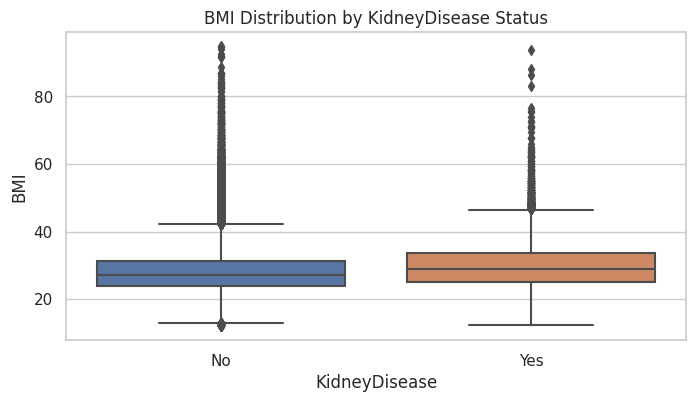

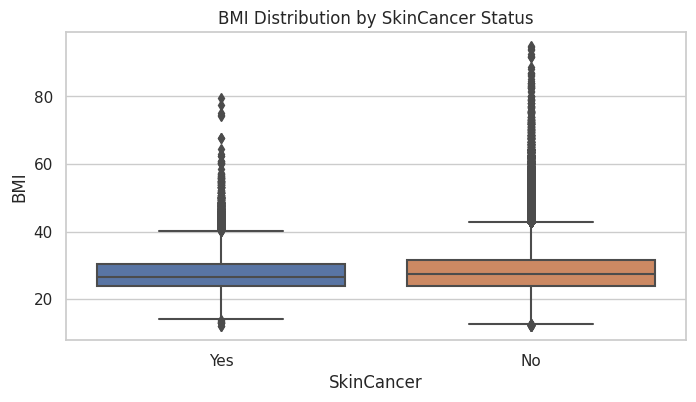

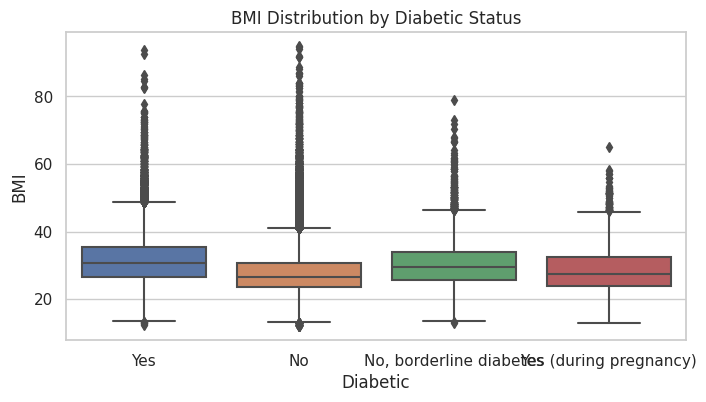

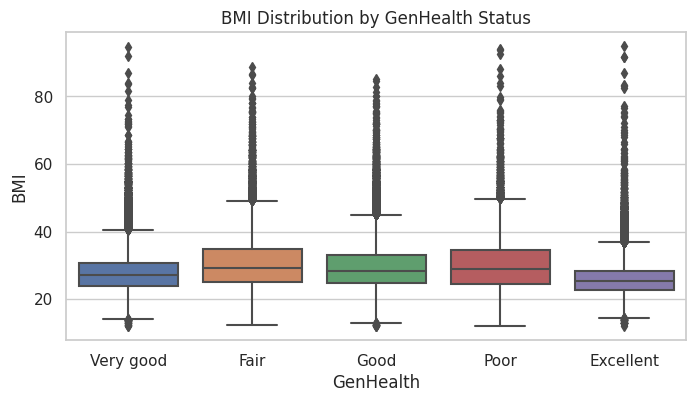

In [16]:
# BMI and Health Conditions: Analyzing the relationship between BMI and kidney disease, skin cancer, diabetes, and general health perception

# Function to create boxplots for BMI across different categories of a health condition
def plot_bmi_vs_condition(condition):
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=condition, y='BMI', data=heart_data)
    plt.title(f'BMI Distribution by {condition} Status')
    plt.ylabel('BMI')
    plt.xlabel(condition)
    plt.show()

# Health conditions to analyze with BMI
health_conditions = ['KidneyDisease','SkinCancer', 'Diabetic', 'GenHealth']

# Plotting BMI distribution for each health condition
for condition in health_conditions:
    plot_bmi_vs_condition(condition)


## Analysing relationship between BMI and sleep

In [17]:
# Grouping the data by sleep hours and calculating the average BMI for each group
average_bmi_by_sleep = heart_data.groupby('SleepTime')['BMI'].mean()

average_bmi_by_sleep

SleepTime
1.0     27.839238
2.0     29.142995
3.0     29.806315
4.0     29.735307
5.0     29.523832
6.0     28.979228
7.0     27.917334
8.0     27.890723
9.0     27.945354
10.0    28.691989
11.0    29.134434
12.0    29.440254
13.0    30.579588
14.0    30.637243
15.0    29.628466
16.0    30.258941
17.0    27.250952
18.0    29.805686
19.0    30.233333
20.0    30.419062
21.0    28.065000
22.0    26.534444
23.0    34.550000
24.0    32.892667
Name: BMI, dtype: float64

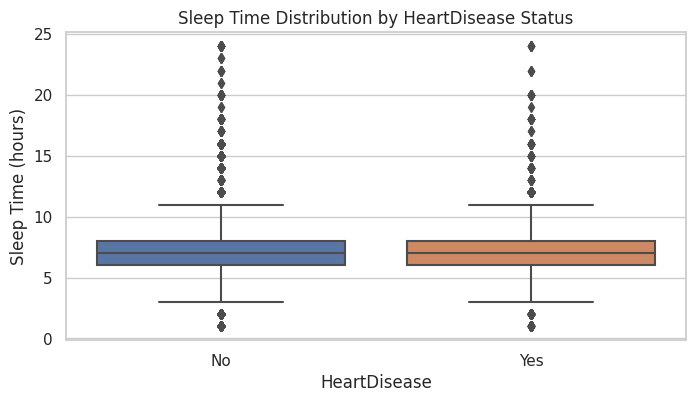

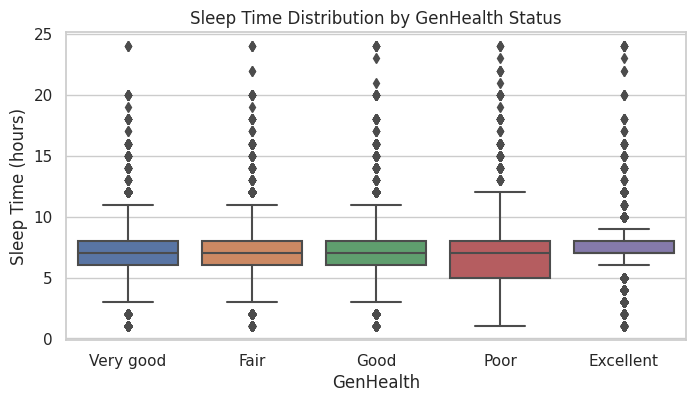

In [18]:
# Sleep Patterns and Health: Analyzing the relationship between sleep duration and heart disease, mental health, and general health perception

# Function to create boxplots for SleepTime across different categories of a health condition
def plot_sleep_vs_condition(condition):
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=condition, y='SleepTime', data=heart_data)
    plt.title(f'Sleep Time Distribution by {condition} Status')
    plt.ylabel('Sleep Time (hours)')
    plt.xlabel(condition)
    plt.show()

# Health conditions to analyze with Sleep Time
health_conditions_sleep = ['HeartDisease', 'GenHealth']

# Plotting Sleep Time distribution for each health condition
for condition in health_conditions_sleep:
    plot_sleep_vs_condition(condition)


### Race Distribution

In [19]:
### Race distribution to further determine heart disease and skin cancer prevalence among races in dataset
race_distribution = heart_data['Race'].value_counts()

race_distribution

White                             245212
Hispanic                           27446
Black                              22939
Other                              10928
Asian                               8068
American Indian/Alaskan Native      5202
Name: Race, dtype: int64

### Prevalence of Heart Disease by Race

In [20]:
# Number of individuals with heart disease in each race category
heart_disease_by_race = heart_data[heart_data['HeartDisease'] == 'Yes'].groupby('Race').size()

# Calculating the prevalence of heart disease in each race category
prevalence_by_race = (heart_disease_by_race / race_distribution) * 100

prevalence_by_race

American Indian/Alaskan Native    10.419070
Asian                              3.296976
Black                              7.537382
Hispanic                           5.257597
Other                              8.107613
White                              9.178588
dtype: float64

<ipython-input-21-021c93b2e5b7>:5: FutureWarning:

['Smoking', 'AlcoholDrinking', 'PhysicalActivity', 'GenHealth'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.



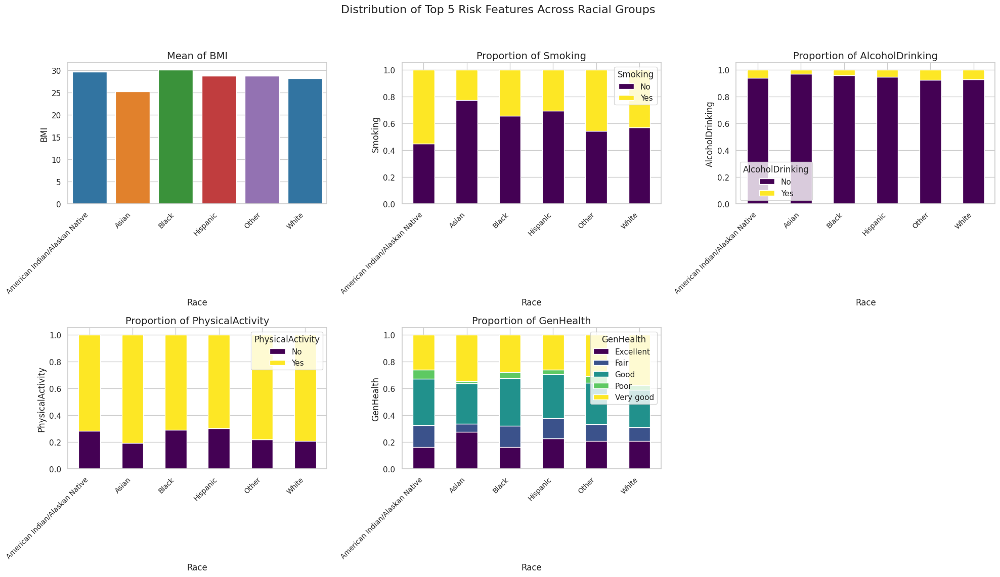

In [21]:
# Top 5 risk features for heart disease
risk_features = ['BMI', 'Smoking', 'AlcoholDrinking', 'PhysicalActivity', 'GenHealth']

# Calculating the mean or proportion of these risk features across racial groups
race_risk_features = heart_data.groupby('Race')[risk_features].agg(['mean', 'sum'])

# Plotting the mean or proportion of risk features across racial groups
fig, axes = plt.subplots(2, 3, figsize=(20, 12), sharex=False)
fig.suptitle('Distribution of Top 5 Risk Features Across Racial Groups', fontsize=16)

# Adjust the space between plots for clarity
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# Define a color palette for the categorical data
palette = sns.color_palette("tab10", n_colors=heart_data['GenHealth'].nunique())

for i, feature in enumerate(risk_features):
    ax = axes.flatten()[i]
    if heart_data[feature].dtype == 'object':
        # For categorical features, calculate and plot the proportion
        data = heart_data.groupby('Race')[feature].value_counts(normalize=True).unstack()
        data.plot(kind='bar', stacked=True, ax=ax, colormap='viridis')
        ax.set_title(f'Proportion of {feature}', fontsize=14)
    else:
        # For numerical features, calculate and plot the mean
        data = heart_data.groupby('Race')[feature].mean()
        sns.barplot(x=data.index, y=data.values, ax=ax, palette=palette)
        ax.set_title(f'Mean of {feature}', fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=10)
    ax.set_xlabel('Race', fontsize=12)
    ax.set_ylabel(feature, fontsize=12)

# Hide the empty subplot
if len(risk_features) < 6:
    fig.delaxes(axes.flatten()[-1])

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

### Prevalence of Skin Cancer by Race

In [22]:
# Number of individuals with skin cancer in each race category
skin_cancer_by_race = heart_data[heart_data['SkinCancer'] == 'Yes'].groupby('Race').size()

# Calculating the prevalence of skin cancer in each race category
prevalence_skin_cancer_by_race = (skin_cancer_by_race / race_distribution) * 100

prevalence_skin_cancer_by_race



American Indian/Alaskan Native     3.267974
Asian                              0.694100
Black                              0.601596
Hispanic                           1.508417
Other                              4.392387
White                             11.647472
dtype: float64

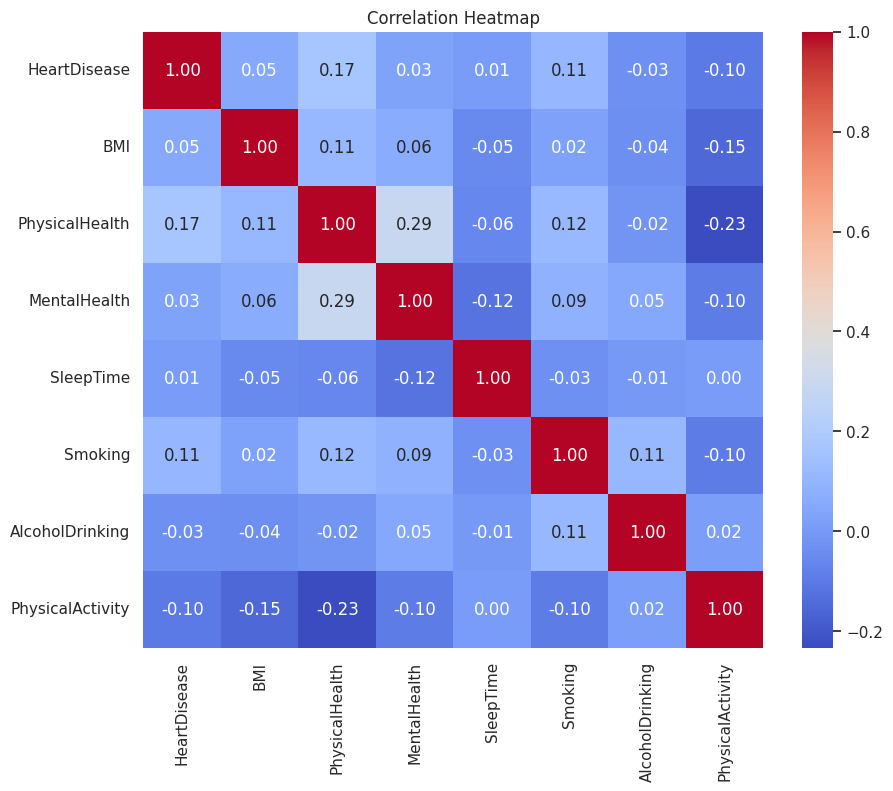

HeartDisease        1.000000
BMI                 0.051803
PhysicalHealth      0.170721
MentalHealth        0.028591
SleepTime           0.008327
Smoking             0.107764
AlcoholDrinking    -0.032080
PhysicalActivity   -0.100030
Name: HeartDisease, dtype: float64

In [23]:
# Bivariate Correlation Analysis: Heart Disease with Various Factors

# Converting 'HeartDisease' to numeric for correlation analysis (Yes: 1, No: 0)
heart_data_numeric = heart_data.copy()
heart_data_numeric['HeartDisease'] = heart_data['HeartDisease'].map({'Yes': 1, 'No': 0})

# Selecting variables for correlation analysis
variables_for_correlation = ['HeartDisease', 'BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime',
                             'Smoking', 'AlcoholDrinking', 'PhysicalActivity']

# Converting categorical variables to numeric for correlation analysis
heart_data_numeric['Smoking'] = heart_data['Smoking'].map({'Yes': 1, 'No': 0})
heart_data_numeric['AlcoholDrinking'] = heart_data['AlcoholDrinking'].map({'Yes': 1, 'No': 0})
heart_data_numeric['PhysicalActivity'] = heart_data['PhysicalActivity'].map({'Yes': 1, 'No': 0})

# Calculating the correlation matrix for the selected variables
correlation_matrix = heart_data_numeric[variables_for_correlation].corr(method='pearson')

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

# Calculating Pearson correlation coefficients
correlation_results = heart_data_numeric[variables_for_correlation].corr(method='pearson')['HeartDisease']

correlation_results



## Hypothesis Testing

In [24]:
# Encoding categorical variables
label_encoder = LabelEncoder()
for column in ['Sex', 'Smoking', 'AlcoholDrinking', 'PhysicalActivity', 'Stroke', 'DiffWalking', 'Asthma', 'KidneyDisease', 'SkinCancer']:
    heart_data[column] = label_encoder.fit_transform(heart_data[column])

# Converting 'HeartDisease' to numeric (Yes: 1, No: 0)
heart_data['HeartDisease'] = heart_data['HeartDisease'].map({'Yes': 1, 'No': 0})

# Converting 'AgeCategory', 'Race', 'Diabetic', 'GenHealth' to dummy variables
heart_data = pd.get_dummies(heart_data, columns=['AgeCategory', 'Race', 'Diabetic', 'GenHealth'], drop_first=True)

# Checking for missing values
missing_values = heart_data.isnull().sum()

missing_values


HeartDisease                        0
BMI                                 0
Smoking                             0
AlcoholDrinking                     0
Stroke                              0
PhysicalHealth                      0
MentalHealth                        0
DiffWalking                         0
Sex                                 0
PhysicalActivity                    0
SleepTime                           0
Asthma                              0
KidneyDisease                       0
SkinCancer                          0
AgeCategory_25-29                   0
AgeCategory_30-34                   0
AgeCategory_35-39                   0
AgeCategory_40-44                   0
AgeCategory_45-49                   0
AgeCategory_50-54                   0
AgeCategory_55-59                   0
AgeCategory_60-64                   0
AgeCategory_65-69                   0
AgeCategory_70-74                   0
AgeCategory_75-79                   0
AgeCategory_80 or older             0
Race_Asian  

# Assess multicollinearity using correlation matrix

In [25]:
# Generating a correlation matrix for the features
correlation_matrix = heart_data.drop('HeartDisease', axis=1).corr()

# Displaying the correlation matrix
correlation_matrix

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,PhysicalActivity,SleepTime,...,Race_Hispanic,Race_Other,Race_White,"Diabetic_No, borderline diabetes",Diabetic_Yes,Diabetic_Yes (during pregnancy),GenHealth_Fair,GenHealth_Good,GenHealth_Poor,GenHealth_Very good
BMI,1.000000,0.023118,-0.038816,0.019733,0.109788,0.064131,0.181678,0.026940,-0.150616,-0.051822,...,0.023750,0.012535,-0.049060,0.049231,0.203494,0.008198,0.127364,0.118047,0.062501,-0.065954
Smoking,0.023118,1.000000,0.111768,0.061226,0.115352,0.085157,0.120074,0.085052,-0.097174,-0.030336,...,-0.066873,0.016205,0.072367,0.007143,0.058434,-0.005385,0.095620,0.059651,0.086520,-0.052305
AlcoholDrinking,-0.038816,0.111768,1.000000,-0.019858,-0.017254,0.051282,-0.035328,0.004200,0.017487,-0.005065,...,-0.015554,0.005455,0.033342,-0.008165,-0.058208,-0.004077,-0.018859,-0.007808,-0.017068,0.013005
Stroke,0.019733,0.061226,-0.019858,1.000000,0.137014,0.046467,0.174143,-0.003091,-0.079455,0.011900,...,-0.025823,0.005743,0.001154,0.011172,0.108407,-0.004526,0.104983,0.013159,0.133641,-0.069395
PhysicalHealth,0.109788,0.115352,-0.017254,0.137014,1.000000,0.287987,0.428373,-0.040904,-0.232283,-0.061387,...,-0.005571,0.016102,-0.003968,0.021437,0.158207,-0.000773,0.303773,-0.037663,0.471919,-0.196462
MentalHealth,0.064131,0.085157,0.051282,0.046467,0.287987,1.000000,0.152235,-0.100058,-0.095808,-0.119717,...,0.011167,0.031385,-0.024489,0.011056,0.025480,0.018742,0.151321,0.013353,0.192079,-0.089956
DiffWalking,0.181678,0.120074,-0.035328,0.174143,0.428373,0.152235,1.000000,-0.068860,-0.278524,-0.022216,...,-0.008214,0.008483,-0.015516,0.031843,0.216605,-0.007040,0.282517,0.031570,0.308767,-0.184986
Sex,0.026940,0.085052,0.004200,-0.003091,-0.040904,-0.100058,-0.068860,1.000000,0.048247,-0.015704,...,-0.003607,0.008762,0.017314,-0.004295,0.020718,-0.085477,-0.022456,0.003642,-0.010667,-0.003239
PhysicalActivity,-0.150616,-0.097174,0.017487,-0.079455,-0.232283,-0.095808,-0.278524,0.048247,1.000000,0.003849,...,-0.056564,0.001808,0.064172,-0.017253,-0.140571,0.001501,-0.174255,-0.072263,-0.174144,0.132472
SleepTime,-0.051822,-0.030336,-0.005065,0.011900,-0.061387,-0.119717,-0.022216,-0.015704,0.003849,1.000000,...,-0.013242,-0.031007,0.042905,-0.006957,0.006658,-0.011668,-0.040923,-0.013725,-0.033074,0.019379


In [26]:
# Addressing multicollinearity based on the correlation matrix and defining hypothesis
# Features for H1: Demographic and Lifestyle Factors
features_h1 = ['Sex', 'Smoking', 'AlcoholDrinking', 'PhysicalActivity']
features_h1.extend([col for col in heart_data.columns if 'AgeCategory' in col or 'Race' in col])

# Features for H2: Health-Related Factors
features_h2 = ['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime', 'Diabetic_Yes', 'Stroke', 'Asthma', 'KidneyDisease', 'SkinCancer']
features_h2.extend([col for col in heart_data.columns if 'GenHealth' in col])

# Dependent variable
y = heart_data['HeartDisease']

print(y.value_counts())

# Logistic Regression for H1
X_h1 = sm.add_constant(heart_data[features_h1])
# Adding a constant
logit_model_h1 = sm.Logit(y, X_h1)
result_h1 = logit_model_h1.fit()

# Logistic Regression for H2
X_h2 = sm.add_constant(heart_data[features_h2])
# Impute missing values in X_h2
imputer = SimpleImputer(strategy='mean')
X_h2_imputed = imputer.fit_transform(X_h2)

# Convert the imputed data back to a DataFrame and add the column names
X_h2_imputed_df = pd.DataFrame(X_h2_imputed, columns=X_h2.columns)

# Now create the logistic regression model with the DataFrame
logit_model_h2 = sm.Logit(y, X_h2_imputed_df)
result_h2 = logit_model_h2.fit()

# Outputting the summary of the logistic regression for H1 and H2
result_h1_summary = result_h1.summary()
result_h2_summary = result_h2.summary()

result_h1_summary, result_h2_summary

0    292422
1     27373
Name: HeartDisease, dtype: int64
Optimization terminated successfully.
         Current function value: 0.250862
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.249306
         Iterations 8


(<class 'statsmodels.iolib.summary.Summary'>
 """
                            Logit Regression Results                           
 Dep. Variable:           HeartDisease   No. Observations:               319795
 Model:                          Logit   Df Residuals:                   319773
 Method:                           MLE   Df Model:                           21
 Date:                Fri, 12 Jan 2024   Pseudo R-squ.:                  0.1416
 Time:                        07:58:33   Log-Likelihood:                -80224.
 converged:                       True   LL-Null:                       -93453.
 Covariance Type:            nonrobust   LLR p-value:                     0.000
                               coef    std err          z      P>|z|      [0.025      0.975]
 -------------------------------------------------------------------------------------------
 const                      -4.7605      0.101    -47.138      0.000      -4.958      -4.563
 Sex                         0.

In [27]:
# Define the target variable
target_variable = 'HeartDisease'

X = heart_data.drop(target_variable, axis=1)
y = heart_data[target_variable]

# Get feature names after encoding and before scaling
feature_names = X.columns.tolist()

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Feature selection
selector = SelectKBest(score_func=f_classif, k=min(7, X_train_scaled.shape[1]))
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_test_scaled)

# Get the indices of the selected features
selected_indices = selector.get_support(indices=True)

# Get the top feature names
top_feature_names = [feature_names[i] for i in selected_indices]
print("Top 7 features:", top_feature_names)

Top 7 features: ['Stroke', 'PhysicalHealth', 'DiffWalking', 'KidneyDisease', 'Diabetic_Yes', 'GenHealth_Fair', 'GenHealth_Poor']


# Model building, first without smote then with smote to compare values and establish effect of smote.

In [28]:
# Define models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree Classifier": DecisionTreeClassifier(),
    "Random Forest Classifier": RandomForestClassifier(),
    "K-Nearest Neighbors": KNeighborsClassifier()
}

# Results dictionary
results = {}

# Train models without SMOTE
for name, model in models.items():
    model.fit(X_train_selected, y_train)
    y_pred = model.predict(X_test_selected)
    y_pred_proba = model.predict_proba(X_test_selected)[:, 1]

    results[name] = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred),
        "recall": recall_score(y_test, y_pred),
        "f1_score": f1_score(y_test, y_pred),
        "roc_auc": roc_auc_score(y_test, y_pred_proba),
        "classification_report": classification_report(y_test, y_pred)
    }

In [29]:
# Train models with SMOTE
for name, model in models.items():
    pipeline = Pipeline([
        ('smote', SMOTE(random_state=42)),
        ('model', model)
    ])
    pipeline.fit(X_train_selected, y_train)
    y_pred = pipeline.predict(X_test_selected)
    y_pred_proba = pipeline.predict_proba(X_test_selected)[:, 1]

    results[name + " with SMOTE"] = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred),
        "recall": recall_score(y_test, y_pred),
        "f1_score": f1_score(y_test, y_pred),
        "roc_auc": roc_auc_score(y_test, y_pred_proba),
        "classification_report": classification_report(y_test, y_pred)
    }

results

{'Logistic Regression': {'accuracy': 0.9147891618067825,
  'precision': 0.5148632580261593,
  'recall': 0.07908675799086758,
  'f1_score': 0.13711209626345786,
  'roc_auc': 0.7398348890802278,
  'classification_report': '              precision    recall  f1-score   support\n\n           0       0.92      0.99      0.96     58484\n           1       0.51      0.08      0.14      5475\n\n    accuracy                           0.91     63959\n   macro avg       0.72      0.54      0.55     63959\nweighted avg       0.89      0.91      0.89     63959\n'},
 'Decision Tree Classifier': {'accuracy': 0.9146484466611423,
  'precision': 0.5168067226890757,
  'recall': 0.044931506849315066,
  'f1_score': 0.08267518064190893,
  'roc_auc': 0.7341050293894533,
  'classification_report': '              precision    recall  f1-score   support\n\n           0       0.92      1.00      0.96     58484\n           1       0.52      0.04      0.08      5475\n\n    accuracy                           0.91  

# IMPROVE ON THE BEST MODEL (LOGISTIC REGRESSION) - Hyperparameter tuning and threshold adjustment with smote and by downsampling majority class

## Still with Smote

In [30]:
# Define the parameter grid for Logistic Regression
param_grid = {
    'logisticregression__C': [0.1, 1, 10],
    'logisticregression__penalty': ['l2']
}

pipeline = make_pipeline_imblearn(
    SMOTE(),
    LogisticRegression(max_iter=1000)
)
# Custom scorer with the correct positive label
recall_scorer = make_scorer(recall_score)

# Perform grid search with the pipeline on the polynomial features
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring=recall_scorer)
grid_search.fit(X_train_selected, y_train)

# Print best parameters
print("Best parameters:", grid_search.best_params_)

# Make predictions using the best model on the polynomial test data
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_selected)

Best parameters: {'logisticregression__C': 0.1, 'logisticregression__penalty': 'l2'}


In [31]:
# Predict probabilities for the positive class
y_probs = best_model.predict_proba(X_test_selected)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_proba)
precision, recall, thresholds = precision_recall_curve(y_test, y_probs)

In [32]:
# Calculate F1 scores for each threshold
f1_scores = 2 * (precision * recall) / (precision + recall)

# Find the index of the maximum F1 score
optimal_idx = np.argmax(f1_scores)

# Find the optimal threshold corresponding to this F1 score
optimal_threshold = thresholds[optimal_idx]

In [33]:
# Adjust predictions based on the optimal threshold
y_pred_adjusted = (y_probs >= optimal_threshold).astype(int)

              precision    recall  f1-score   support

           0       0.95      0.88      0.91     58484
           1       0.27      0.46      0.34      5475

    accuracy                           0.85     63959
   macro avg       0.61      0.67      0.63     63959
weighted avg       0.89      0.85      0.86     63959

ROC AUC Score: 0.6682972465013263


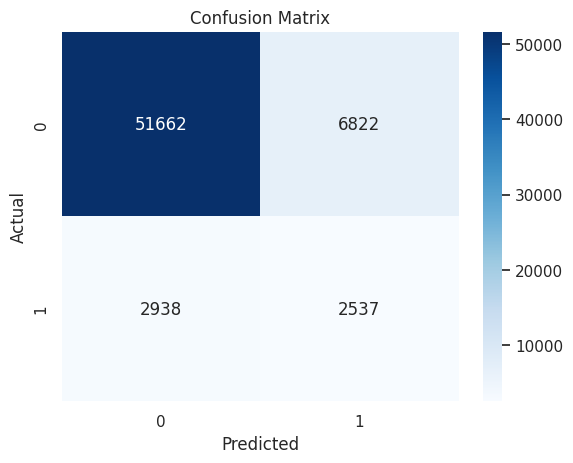

In [34]:
# Print classification report and confusion matrix
print(classification_report(y_test, y_pred_adjusted))
print("ROC AUC Score:", roc_auc)
cm = confusion_matrix(y_test, y_pred_adjusted)
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title("Confusion Matrix")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

## 1. Using a different resampling technique to balance out y feature of train data set aside smote

In [35]:
# Count class occurrences
class_counts = Counter(y_train)
print(class_counts)

Counter({0: 233938, 1: 21898})


In [36]:

# Determine majority and minority class labels
majority_class_label = max(class_counts, key=class_counts.get)
minority_class_label = min(class_counts, key=class_counts.get)

In [37]:
train_data = pd.DataFrame(X_train_selected)
train_data['target'] = y_train

# Separate majority and minority classes
majority_class = train_data[train_data.target == majority_class_label]
minority_class = train_data[train_data.target == minority_class_label]

# Downsample majority class
majority_downsampled = resample(majority_class,
                                replace=False,  # sample without replacement
                                n_samples=len(minority_class),  # to match minority class
                                random_state=42)  # reproducible results

# Combine minority class with downsampled majority class
downsampled_train_data = pd.concat([majority_downsampled, minority_class])

# Splitting features and target
X_train_resampled = downsampled_train_data.drop('target', axis=1)
y_train_resampled = downsampled_train_data.target

## 2) Hyperparameter tuning

In [38]:
# Define the parameter grid for Logistic Regression
param_grid = {
    'logisticregression__C': [0.1, 1, 10],
    'logisticregression__penalty': ['l2']
}

pipeline = make_pipeline(
    LogisticRegression(max_iter=1000)
)

# Perform grid search with the pipeline on the polynomial features
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='recall')
grid_search.fit(X_train_resampled, y_train_resampled)

# Print best parameters
print("Best parameters:", grid_search.best_params_)

# Make predictions using the best model on the polynomial test data
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_selected)

Best parameters: {'logisticregression__C': 1, 'logisticregression__penalty': 'l2'}


In [39]:
# Predict probabilities for the positive class
y_probs = best_model.predict_proba(X_test_selected)[:, 1]

precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
roc_auc = roc_auc_score(y_test, y_pred_proba)

## 3. Apply optimal Threshold to model

In [40]:
# Calculate F1 scores for each threshold
f1_scores = 2 * (precision * recall) / (precision + recall)

# Find the index of the maximum F1 score
optimal_idx = np.argmax(f1_scores)

# Find the optimal threshold corresponding to this F1 score
optimal_threshold = thresholds[optimal_idx]

In [41]:
# Adjust predictions based on the optimal threshold
y_pred_adjusted = (y_probs >= optimal_threshold).astype(int)

              precision    recall  f1-score   support

           0       0.94      0.84      0.89     58484
           1       0.19      0.38      0.25      5475

    accuracy                           0.80     63959
   macro avg       0.56      0.61      0.57     63959
weighted avg       0.87      0.80      0.83     63959

ROC AUC Score: 0.6682972465013263


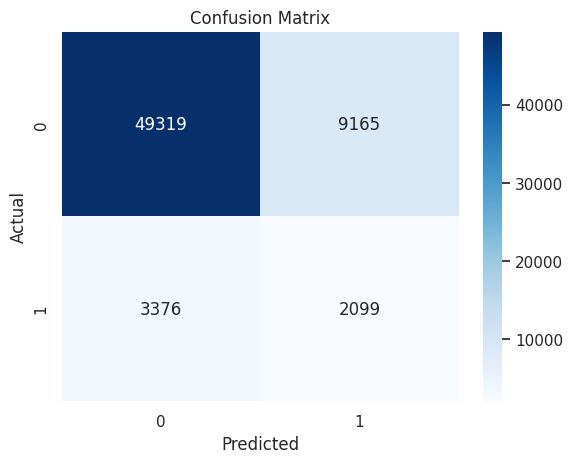

In [42]:
# Print classification report and confusion matrix
print(classification_report(y_test, y_pred_adjusted))
print("ROC AUC Score:", roc_auc)
cm = confusion_matrix(y_test, y_pred_adjusted)
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title("Confusion Matrix")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

### Using smoteenn

In [43]:
# Initialize the resampling method
smote_enn = SMOTEENN(random_state=42)

# Resample the training data
X_resampled, y_resampled = smote_enn.fit_resample(X_train_selected, y_train)

In [44]:
# Define the parameter grid for Logistic Regression
param_grid = {
    'logisticregression__C': [0.1, 1, 10],
    'logisticregression__penalty': ['l2']
}

pipeline = make_pipeline(
    LogisticRegression(max_iter=1000)
)

# Perform grid search with the pipeline on the polynomial features
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='recall')
grid_search.fit(X_resampled, y_resampled)

# Print best parameters
print("Best parameters:", grid_search.best_params_)

# Make predictions using the best model on the polynomial test data
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_selected)

Best parameters: {'logisticregression__C': 1, 'logisticregression__penalty': 'l2'}


In [45]:
# Predict probabilities for the positive class
y_probs = best_model.predict_proba(X_test_selected)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_proba)
precision, recall, thresholds = precision_recall_curve(y_test, y_probs)

In [46]:
# Calculate F1 scores for each threshold
f1_scores = 2 * (precision * recall) / (precision + recall)

# Find the index of the maximum F1 score
optimal_idx = np.argmax(f1_scores)

# Find the optimal threshold corresponding to this F1 score
optimal_threshold = thresholds[optimal_idx]

In [47]:
# Adjust predictions based on the optimal threshold
y_pred_adjusted = (y_probs >= optimal_threshold).astype(int)

              precision    recall  f1-score   support

           0       0.94      0.92      0.93     58484
           1       0.30      0.38      0.34      5475

    accuracy                           0.87     63959
   macro avg       0.62      0.65      0.63     63959
weighted avg       0.89      0.87      0.88     63959

ROC AUC Score: 0.6682972465013263


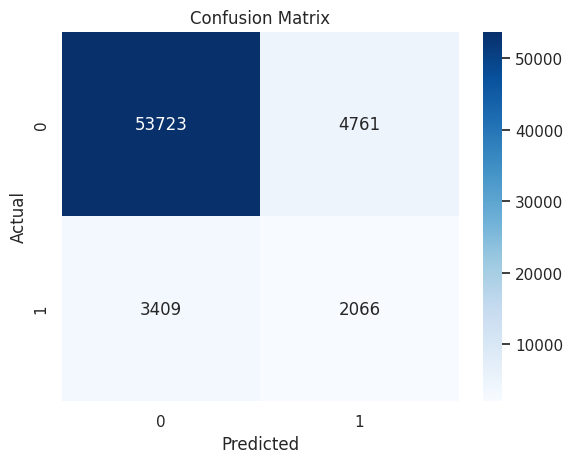

In [48]:
# Print classification report and confusion matrix
print(classification_report(y_test, y_pred_adjusted))
print("ROC AUC Score:", roc_auc)
cm = confusion_matrix(y_test, y_pred_adjusted)
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title("Confusion Matrix")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

### 2. Explore a different Algorithm to potentially have an improved predictive model

##xgb with scaled class weight only




## xgboost on ***class weight adjusted only*** using **scaled and top 7 features (X_train_selected)**

In [49]:
# Class weight calculation
weight = sum(y_train == 0) / sum(y_train == 1)


xgb_model = xgb.XGBClassifier(scale_pos_weight=weight, use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train_selected, y_train)
y_pred = xgb_model.predict(X_test_selected)
y_pred_proba = xgb_model.predict_proba(X_test_selected)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_proba)

print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc)

              precision    recall  f1-score   support

           0       0.96      0.74      0.83     58484
           1       0.19      0.67      0.30      5475

    accuracy                           0.73     63959
   macro avg       0.58      0.70      0.57     63959
weighted avg       0.89      0.73      0.79     63959

ROC AUC Score: 0.7388079993154276


### xgboost on ***smote only*** using **scaled and top 7 features (X_train_selected)**

In [50]:
# Create a pipeline with SMOTE and XGBClassifier
smote_pipeline = Pipeline([
    ('smote', SMOTE()),
    ('xgbclassifier', xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
])

# Fit the pipeline to the training data
smote_pipeline.fit(X_train_selected, y_train)
# Make predictions and predict probabilities on the test set
y_pred = smote_pipeline.predict(X_test_selected)
y_pred_proba = smote_pipeline.predict_proba(X_test_selected)[:, 1]  # Probabilities for the positive class

roc_auc = roc_auc_score(y_test, y_pred_proba)

print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc)

              precision    recall  f1-score   support

           0       0.96      0.74      0.84     58484
           1       0.19      0.66      0.30      5475

    accuracy                           0.73     63959
   macro avg       0.58      0.70      0.57     63959
weighted avg       0.89      0.73      0.79     63959

ROC AUC Score: 0.7341492751871564


### xgboost on ***class weight adjusted only*** with **all features, unscaled(X_train)**

In [51]:

xgb_model = xgb.XGBClassifier(scale_pos_weight=weight, use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_proba)

print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc)

              precision    recall  f1-score   support

           0       0.97      0.75      0.85     58484
           1       0.22      0.76      0.34      5475

    accuracy                           0.75     63959
   macro avg       0.60      0.76      0.59     63959
weighted avg       0.91      0.75      0.80     63959

ROC AUC Score: 0.8315351581933661


### xgboost using **scaled data, top 7 features (X_train_selected)**, ***without smote, optimized threshold,class weight, 3 fold cross validation Hyperparameter tuning***

In [52]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'gamma': [0, 0.5, 1],
    'min_child_weight': [1, 5, 10],
    'subsample': [0.5, 0.7, 1.0]
}

# Initialize GridSearchCV with the XGBClassifier and the parameter grid
grid_search = GridSearchCV(xgb.XGBClassifier(scale_pos_weight=weight, use_label_encoder=False, eval_metric='logloss'),
                           param_grid, cv=3, scoring='roc_auc', n_jobs=-1, verbose=2)

# Fit GridSearchCV to the training data
grid_search.fit(X_train_selected, y_train)

# Extract the best estimator
best_xgb_classifier = grid_search.best_estimator_

# Predict probabilities for the positive class with the best estimator
best_y_probs = best_xgb_classifier.predict_proba(X_test_selected)[:, 1]

# Calculate precision, recall, and thresholds for the best estimator
best_precision, best_recall, best_thresholds = precision_recall_curve(y_test, best_y_probs)

# Calculate F1 scores for each threshold for the best estimator
best_f1_scores = 2 * (best_precision * best_recall) / (best_precision + best_recall)
best_optimal_idx = np.argmax(best_f1_scores)
best_optimal_threshold = best_thresholds[best_optimal_idx]

# Apply the optimal threshold to adjust predictions for the best estimator
best_y_pred_adjusted = (best_y_probs >= best_optimal_threshold).astype(int)

# Generate a classification report with the adjusted predictions for the best estimator
best_adjusted_report = classification_report(y_test, best_y_pred_adjusted)

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, best_y_probs)

print(best_adjusted_report)
print(roc_auc)
print("Best Hyperparameters:", grid_search.best_params_)

Fitting 3 folds for each of 324 candidates, totalling 972 fits
              precision    recall  f1-score   support

           0       0.94      0.90      0.92     58484
           1       0.28      0.44      0.34      5475

    accuracy                           0.86     63959
   macro avg       0.61      0.67      0.63     63959
weighted avg       0.89      0.86      0.87     63959

0.7384544217534109
Best Hyperparameters: {'gamma': 1, 'learning_rate': 0.2, 'max_depth': 5, 'min_child_weight': 10, 'subsample': 1.0}


### xgboost using ***scaled, top 7 features(X_train_selected)***, with ***smote, and optimized threshold, hyperparameter tuning***

In [53]:
# Define the parameter grid
param_grid = {
    'xgbclassifier__max_depth': [3, 5, 7, 10],
    'xgbclassifier__learning_rate': [0.01, 0.1, 0.2],
    'xgbclassifier__gamma': [0, 0.5, 1],
    'xgbclassifier__min_child_weight': [1, 5, 10],
    'xgbclassifier__subsample': [0.5, 0.7, 1.0]
}

# Create a pipeline with SMOTE and XGBClassifier
pipeline = Pipeline([
    ('smote', SMOTE()),
    ('xgbclassifier', xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
])

# Initialize GridSearchCV with the pipeline and parameter grid
grid_search = GridSearchCV(pipeline, param_grid, cv=3, scoring='roc_auc', n_jobs=-1, verbose=2)

# Fit GridSearchCV to the training data
grid_search.fit(X_train_selected, y_train)

# Extract the best estimator
best_xgb_classifier = grid_search.best_estimator_

# Predict probabilities for the positive class with the best estimator
best_y_probs = best_xgb_classifier.predict_proba(X_test_selected)[:, 1]

# Calculate precision, recall, and thresholds for the best estimator
best_precision, best_recall, best_thresholds = precision_recall_curve(y_test, best_y_probs)

# Calculate F1 scores for each threshold for the best estimator
best_f1_scores = 2 * (best_precision * best_recall) / (best_precision + best_recall)
best_optimal_idx = np.argmax(best_f1_scores)
best_optimal_threshold = best_thresholds[best_optimal_idx]

# Apply the optimal threshold to adjust predictions for the best estimator
best_y_pred_adjusted = (best_y_probs >= best_optimal_threshold).astype(int)

# Generate a classification report with the adjusted predictions for the best estimator
best_adjusted_report = classification_report(y_test, best_y_pred_adjusted)

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, best_y_probs)

print(best_adjusted_report)
print(roc_auc)
print("Best Hyperparameters:", grid_search.best_params_)

Fitting 3 folds for each of 324 candidates, totalling 972 fits
              precision    recall  f1-score   support

           0       0.94      0.90      0.92     58484
           1       0.28      0.43      0.34      5475

    accuracy                           0.86     63959
   macro avg       0.61      0.66      0.63     63959
weighted avg       0.89      0.86      0.87     63959

0.7405841772592684
Best Hyperparameters: {'xgbclassifier__gamma': 1, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__min_child_weight': 10, 'xgbclassifier__subsample': 1.0}


### xgboost using **unscaled data with all features (X_train)**, ***class weight, without smote, and optimized threshold***

In [56]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'gamma': [0, 0.5, 1],
    'min_child_weight': [1, 5, 10],
    'subsample': [0.5, 0.7, 1.0]
}

# Initialize GridSearchCV with the XGBClassifier and the parameter grid
grid_search = GridSearchCV(xgb.XGBClassifier(scale_pos_weight=weight, use_label_encoder=False, eval_metric='logloss'),
                           param_grid, cv=3, scoring='roc_auc', n_jobs=-1, verbose=2)

# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Extract the best estimator
best_xgb_classifier = grid_search.best_estimator_

# Predict probabilities for the positive class with the best estimator
best_y_probs = best_xgb_classifier.predict_proba(X_test)[:, 1]

# Calculate precision, recall, and thresholds for the best estimator
best_precision, best_recall, best_thresholds = precision_recall_curve(y_test, best_y_probs)

# Calculate F1 scores for each threshold for the best estimator
best_f1_scores = 2 * (best_precision * best_recall) / (best_precision + best_recall)
best_optimal_idx = np.argmax(best_f1_scores)
best_optimal_threshold = best_thresholds[best_optimal_idx]

# Apply the optimal threshold to adjust predictions for the best estimator
best_y_pred_adjusted = (best_y_probs >= best_optimal_threshold).astype(int)

# Generate a classification report with the adjusted predictions for the best estimator
best_adjusted_report = classification_report(y_test, best_y_pred_adjusted)

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, best_y_probs)

# Output the classification report, best parameters from grid search, and ROC AUC score
best_adjusted_report, grid_search.best_params_, roc_auc


Fitting 3 folds for each of 324 candidates, totalling 972 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

<ipython-input-56-a849460240cb>:27: RuntimeWarning:

invalid value encountered in divide



('              precision    recall  f1-score   support\n\n           0       0.91      1.00      0.96     58484\n           1       0.00      0.00      0.00      5475\n\n    accuracy                           0.91     63959\n   macro avg       0.46      0.50      0.48     63959\nweighted avg       0.84      0.91      0.87     63959\n',
 {'gamma': 0,
  'learning_rate': 0.2,
  'max_depth': 3,
  'min_child_weight': 10,
  'subsample': 1.0},
 0.8371127567497679)

### xgboost using **unscaled data with all features(X_train**), ***with smote and optimized threshold***

In [55]:
# Define the parameter grid
param_grid = {
    'xgbclassifier__max_depth': [3, 5, 7, 10],
    'xgbclassifier__learning_rate': [0.01, 0.1, 0.2],
    'xgbclassifier__gamma': [0, 0.5, 1],
    'xgbclassifier__min_child_weight': [1, 5, 10],
    'xgbclassifier__subsample': [0.5, 0.7, 1.0]
}

# Create a pipeline with SMOTE and XGBClassifier
pipeline = Pipeline([
    ('smote', SMOTE()),
    ('xgbclassifier', xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
])

# Initialize GridSearchCV with the pipeline and parameter grid
grid_search = GridSearchCV(pipeline, param_grid, cv=3, scoring='roc_auc', n_jobs=-1, verbose=2)

# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Extract the best estimator
best_xgb_classifier = grid_search.best_estimator_

# Predict probabilities for the positive class with the best estimator
best_y_probs = best_xgb_classifier.predict_proba(X_test)[:, 1]

# Calculate precision, recall, and thresholds for the best estimator
best_precision, best_recall, best_thresholds = precision_recall_curve(y_test, best_y_probs)

# Calculate F1 scores for each threshold for the best estimator
best_f1_scores = 2 * (best_precision * best_recall) / (best_precision + best_recall)
best_optimal_idx = np.argmax(best_f1_scores)
best_optimal_threshold = best_thresholds[best_optimal_idx]

# Apply the optimal threshold to adjust predictions for the best estimator
best_y_pred_adjusted = (best_y_probs >= best_optimal_threshold).astype(int)

# Generate a classification report with the adjusted predictions for the best estimator
best_adjusted_report = classification_report(y_test, best_y_pred_adjusted)

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, best_y_probs)


print(best_adjusted_report)
print("Best Hyperparameters:", grid_search.best_params_)
print(roc_auc)

Fitting 3 folds for each of 324 candidates, totalling 972 fits
              precision    recall  f1-score   support

           0       0.95      0.84      0.89     58484
           1       0.23      0.49      0.31      5475

    accuracy                           0.81     63959
   macro avg       0.59      0.66      0.60     63959
weighted avg       0.88      0.81      0.84     63959

Best Hyperparameters: {'xgbclassifier__gamma': 0, 'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 3, 'xgbclassifier__min_child_weight': 5, 'xgbclassifier__subsample': 0.5}
0.7651203139039082


In [62]:
# Initialize and train the XGBoost model
xgb_model = xgb.XGBClassifier(scale_pos_weight=weight, use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train, y_train)

# Make predictions and calculate ROC AUC score
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Output the classification report and ROC AUC Score
print("Classification Report:\n", classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc)

# Predicted vs Actual Output
predicted_vs_actual = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print("Predicted vs Actual Output:\n", predicted_vs_actual.head())

# 3. Feature Importance Analysis
# Using XGBoost's built-in feature importance
feature_importances = xgb_model.get_booster().get_score(importance_type="gain")
sorted_feature_importances = sorted(feature_importances.items(), key=lambda x: x[1], reverse=True)
print("Sorted Feature Importances:", sorted_feature_importances)

# Create a DataFrame from y_test and y_pred for comparison
error_analysis = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred
})

# Filter to only the instances where the model's predictions were incorrect
error_analysis = error_analysis[error_analysis['Actual'] != error_analysis['Predicted']]

print("Error Analysis:", error_analysis.head())

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.75      0.85     58484
           1       0.22      0.76      0.34      5475

    accuracy                           0.75     63959
   macro avg       0.60      0.76      0.59     63959
weighted avg       0.91      0.75      0.80     63959

ROC AUC Score: 0.8315351581933661
Predicted vs Actual Output:
         Actual  Predicted
229267       0          1
133926       0          0
307338       0          0
284517       0          1
58968        0          0
Sorted Feature Importances: [('DiffWalking', 572.9024047851562), ('AgeCategory_80 or older', 417.30572509765625), ('Diabetic_Yes', 344.6855163574219), ('AgeCategory_70-74', 342.9622497558594), ('AgeCategory_75-79', 329.9663391113281), ('GenHealth_Fair', 273.57110595703125), ('GenHealth_Poor', 223.4875030517578), ('AgeCategory_65-69', 220.07736206054688), ('Stroke', 216.0669708251953), ('AgeCategory_25-29', 200.24838256835938),